# Project 4

[1]  Navn, etternavn, ID nummer,  

[2]  Navn, etternavn, ID nummer,

[3]  Roman Shevchuk Stetsyshyn, 284057.

## Introduction

In [1]:
import functions
import matplotlib.pyplot as plt

## Topic 1 Unsupervised learning: Clustering the Milky Way

### Task 1: Milky Way image via MWSkyMap 

In the PDF and Pycharm file that was given to us, we are asked to generate and show an image of the Milky Way. However, this time the image has to be done with the function MWSkyMap, not MSFaceon as used in the file PyGaLaXy.ipynb. This means that the center and the images dimensions have to be decided based on program requirements, making the radius as maximum as possible, and creating the coordinates accordingly to the center of the Milky Way. [1] 

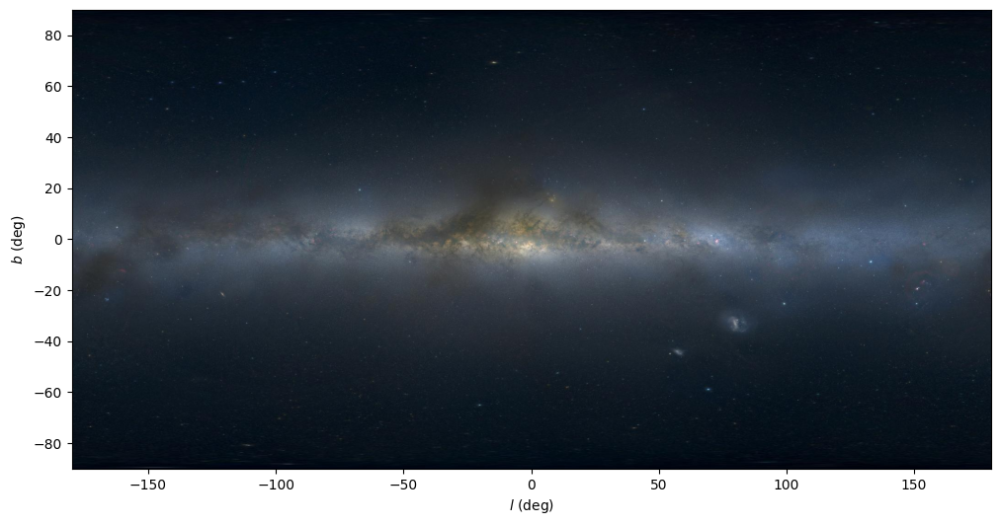

In [2]:
fig,ax = functions.function_task1()

### Task 2: 4 Milky Way sections 

In this task, the same function is used as it was beforehand (MWSkyMap). Nevertheless, this case is to demonstrate the opportunities to generate four different sectors of the Milky Way, having already the Andromeda Galaxy as an example. 

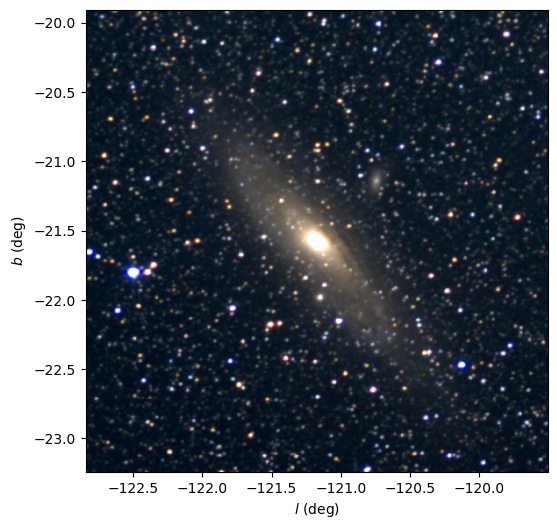

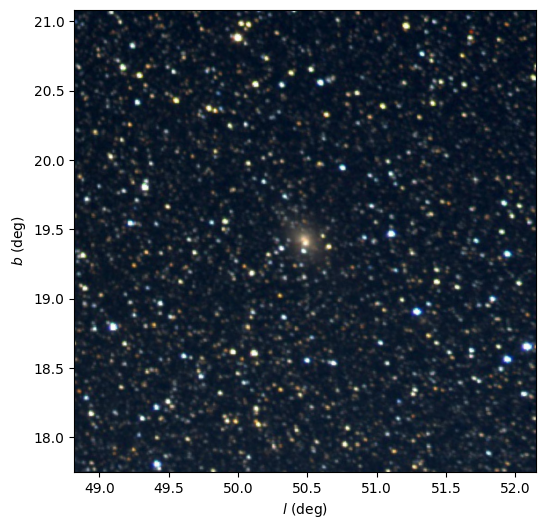

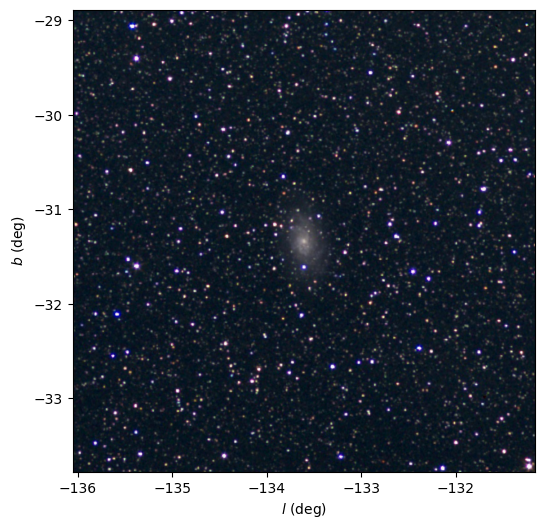

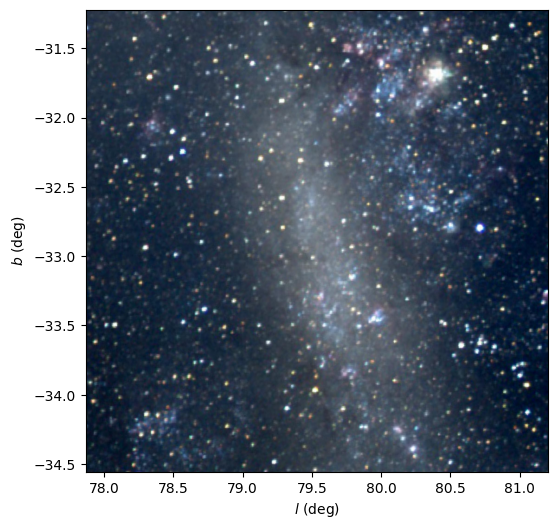

In [3]:
fig1 , ax1, fig2, ax2, fig3, ax3, fig4, ax4 =functions.function_task2()

### Task 3 Conversion of images into RBG array

In order to make the image into an array of RBG we are to remove some "fat" from the image as also make it fit into the shape that we want to have, where it would be an array where the alpha channel or the fourth channel that determines the opacity of each pixel for a better quality and easier usage of the values [2]. Later they are also normalized from 0 to 1, in order to make an easier usage of the next function.

In [4]:
rgb_array = functions.figure_to_rgb_array(fig)

#Proof
print (rgb_array.shape)

(700, 1200, 3)


### Task 4 Color Encoding task 3

The task itself is asking for the categorization of the most prominent pixels, and the visual patterns. So in the context of RGB, the bright stars can be white or yellowish, gas clouds or nebulas are red, pink, green and blue and the background is mostly black with some dust lines that are grey or dark grey.

In order to define what color each pixel should be in, it is divided into the color grading or color that would be most appropriate for the categories that are defined from before. The parameters are based on the 

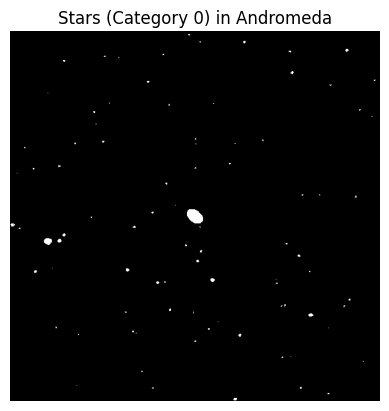

In [5]:
#Proof
img_array = functions.figure_to_rgb_array(fig1)

category_map = functions.generate_color_categories (img_array)

stars_mask = (category_map == 0 )

plt.imshow(stars_mask, cmap="gray")
plt.axis("off")
plt.title("Stars (Category 0) in Andromeda")
plt.show()

### Topic 5 K-NN or K-Mean clustering

After reading and trying different types of clustering methods with the K- Nearest neighbor and the K-menaa, came to the realization that the KJ mean method embarcs a better understanding and usage of the clusters as it can also påossition them in the best way possible, reassembling the images in a better way than the K-NN method as it can be more freele in the decision of where to be inserted or plotted.[3][4] This is because of the usage of the KMeans, wher it looks for pixels that are not color category and claims them, so it can later write cluster labels back into the map.

In [6]:
# Cluster KMeans pixels ( KMeans)

cluster_map, cluster_center = functions.cluster_KMeans_pixels(img_array, category_map, n_clusters=5)


### Task 6 & 7 Overimposed cluster with different categories. 

The form of clustering comes with its own difficult part, as it does not make a simple way. In an attempt to make it simple, there were many failures regarding the colors and the shape of the cluster, until I reached for external help using LLMS in order to find the bugs and the problem in my image.
The reason for this was the lack of the main image or the background that was necessary in order to make the overimposed cluster, that with the help of the rest of functions used beforehand, it made things simpler and easier, as after assigning cluster ID to the other clusters, the mapping of each sub-sampel pixel was done more precise in a new grid. [5]

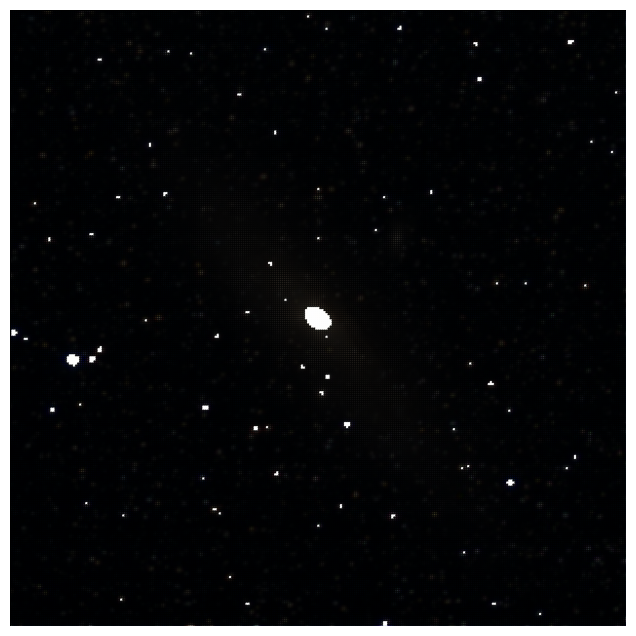

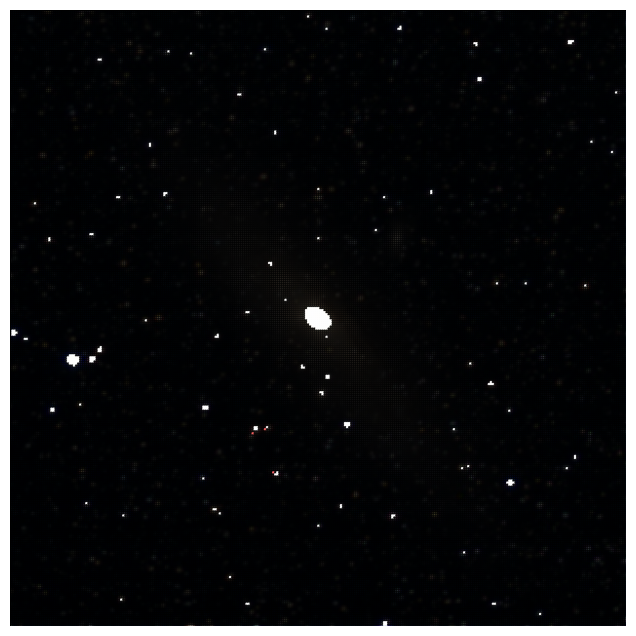

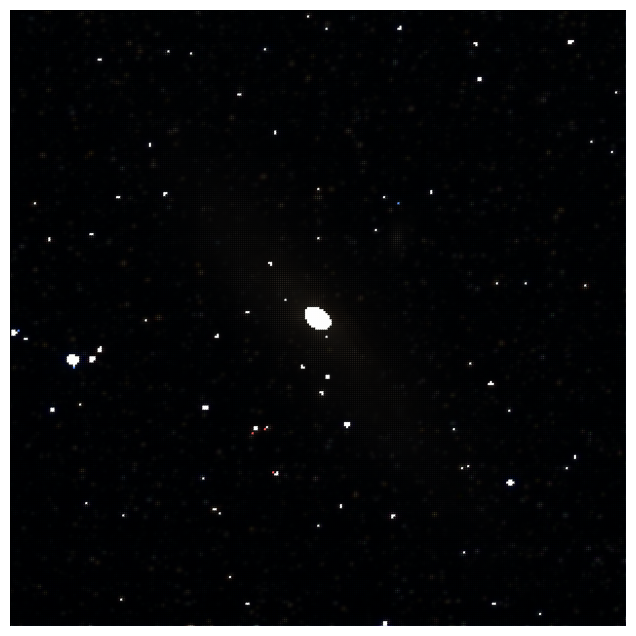

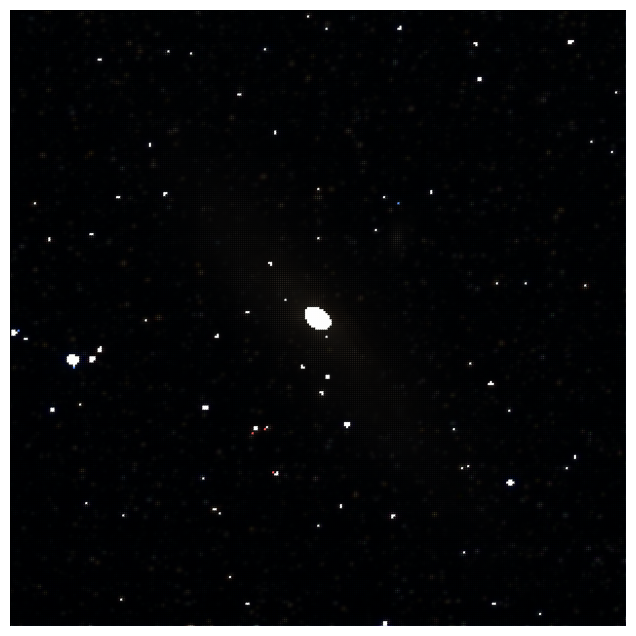

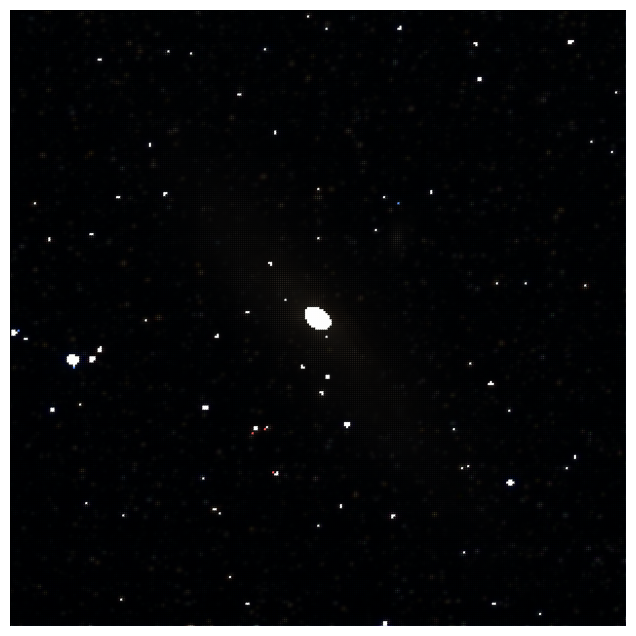

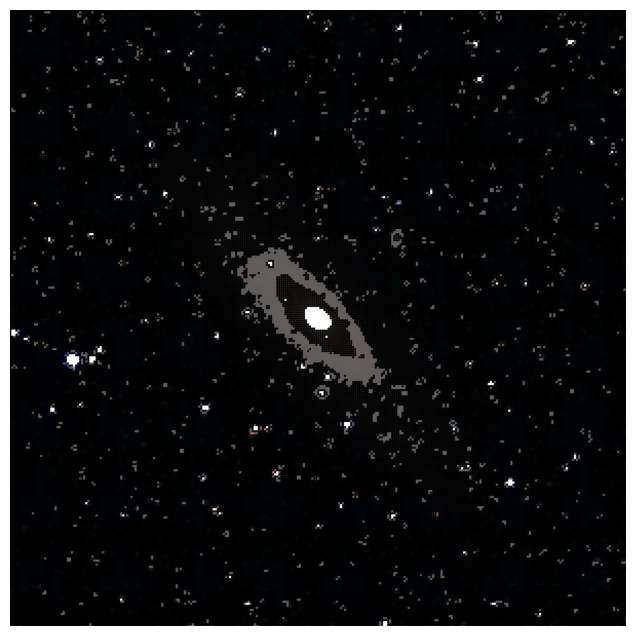

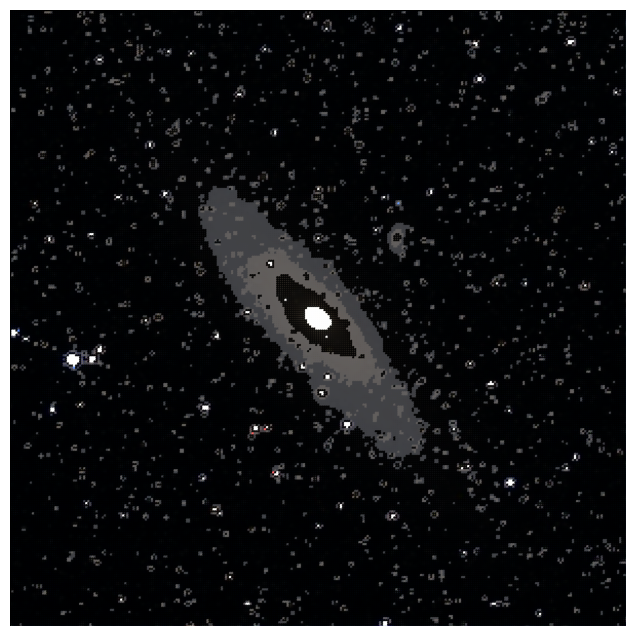

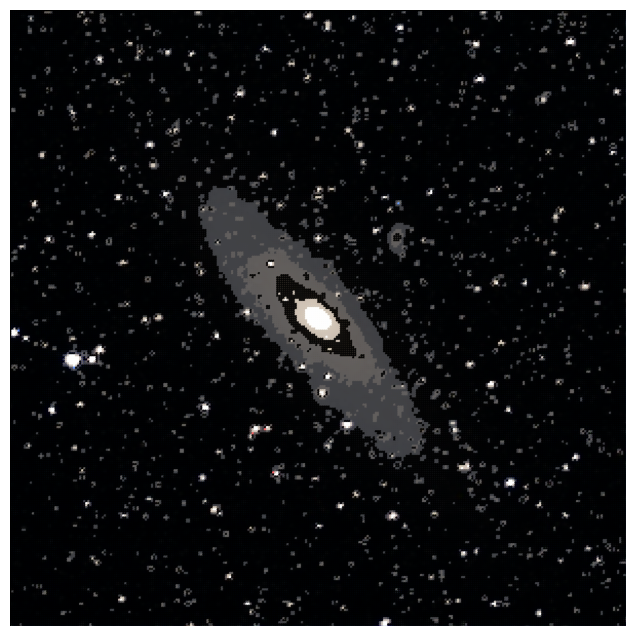

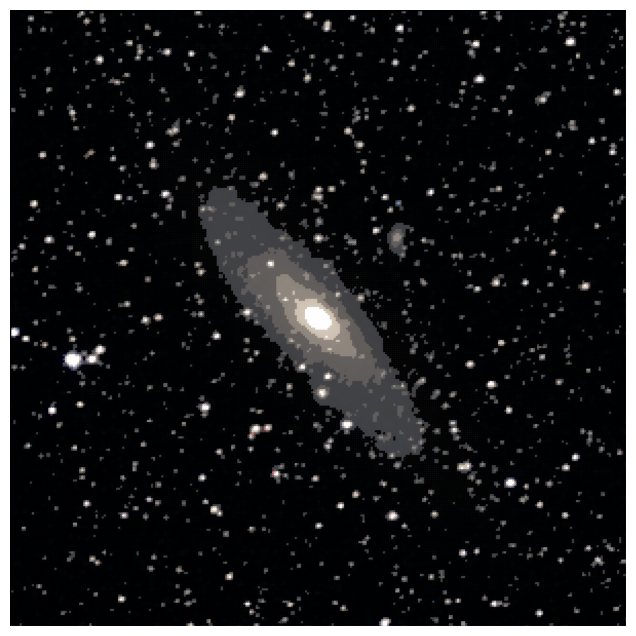

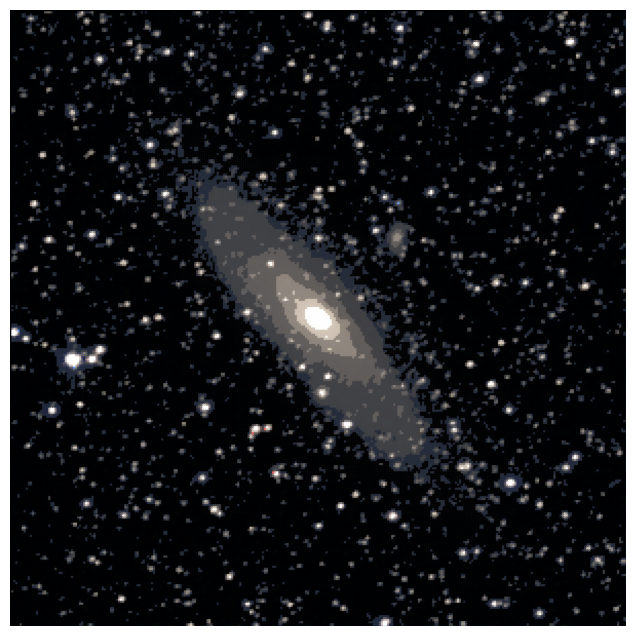

In [7]:
functions.plot_clusters_overlay(img_array, cluster_map, cluster_centers=None, step=2, alpha=0.8)

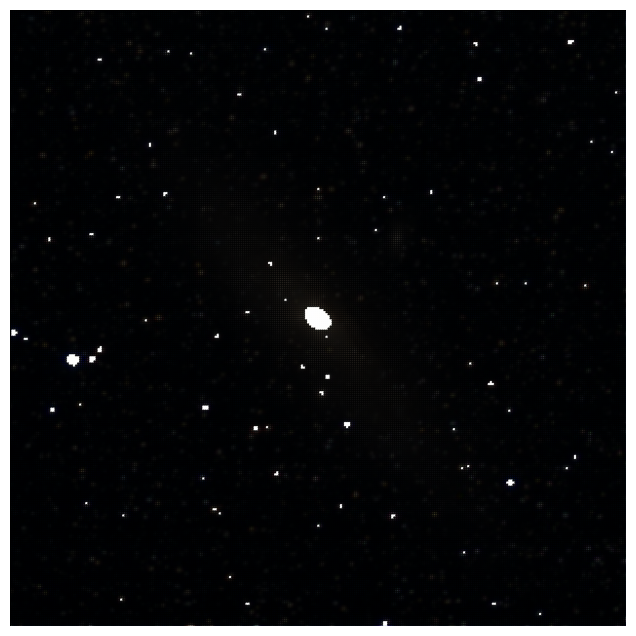

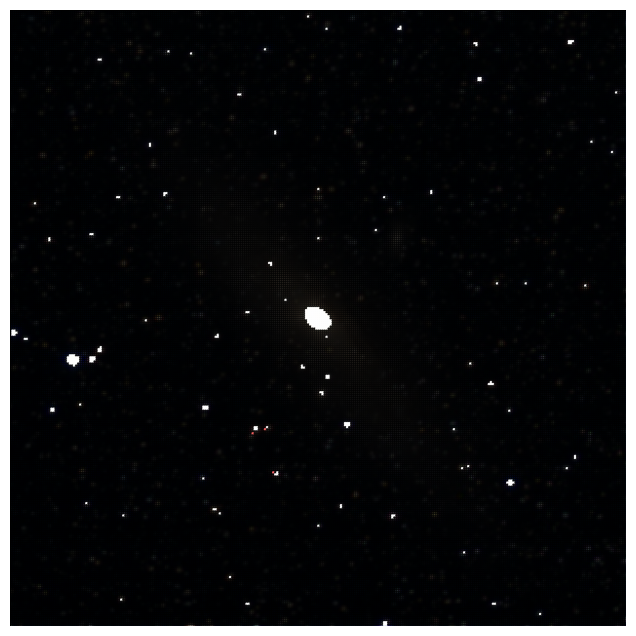

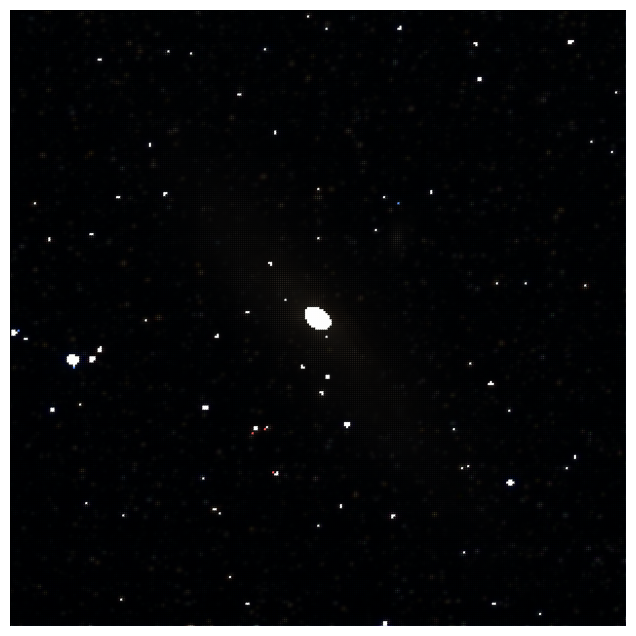

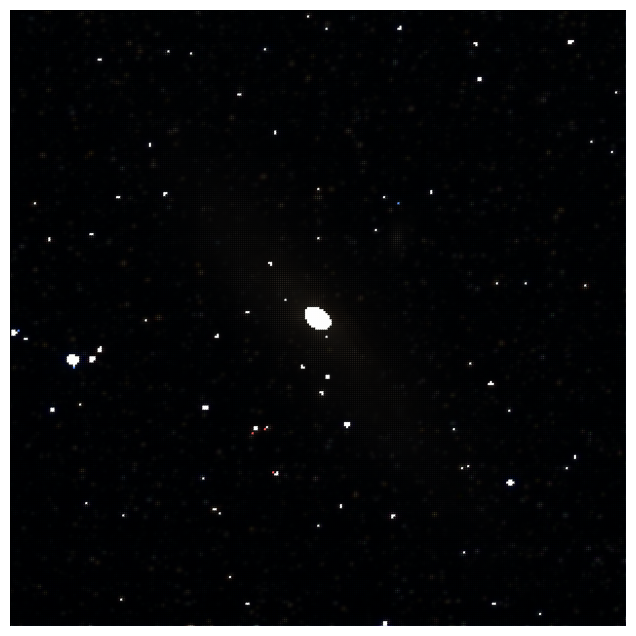

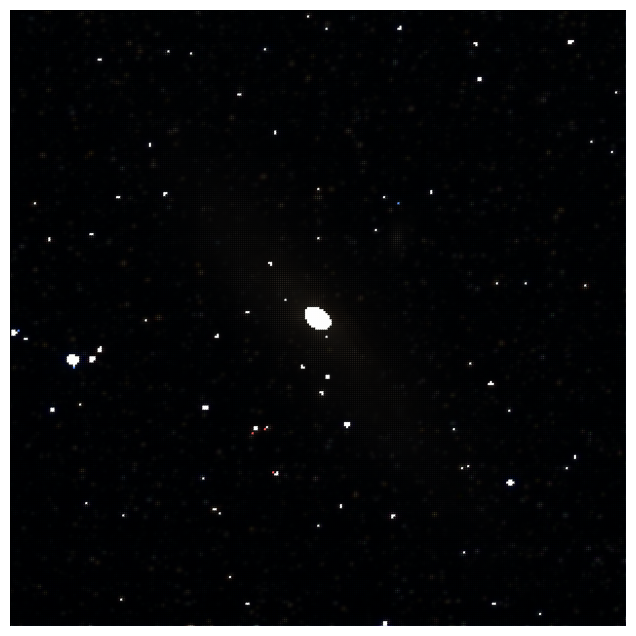

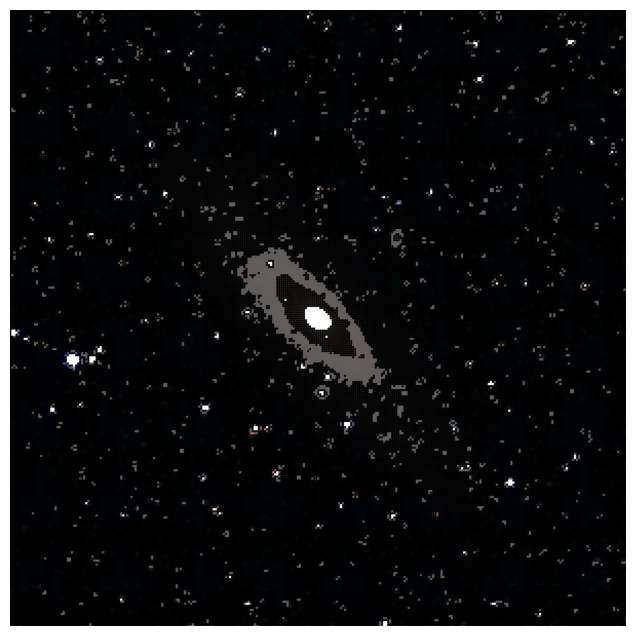

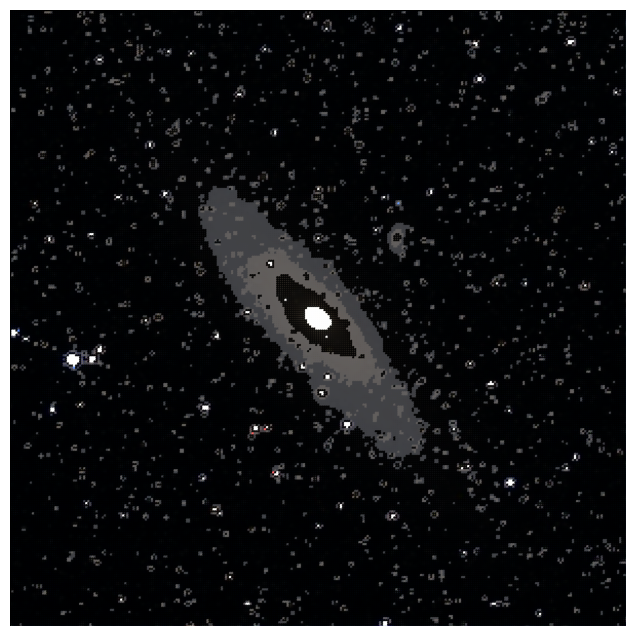

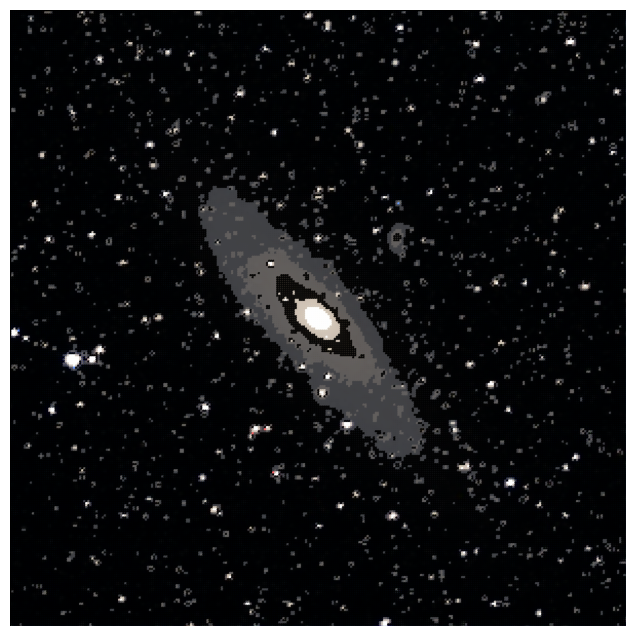

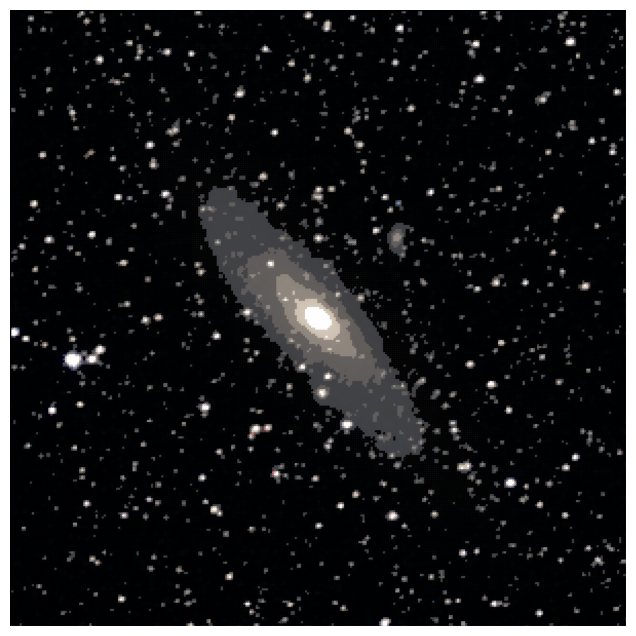

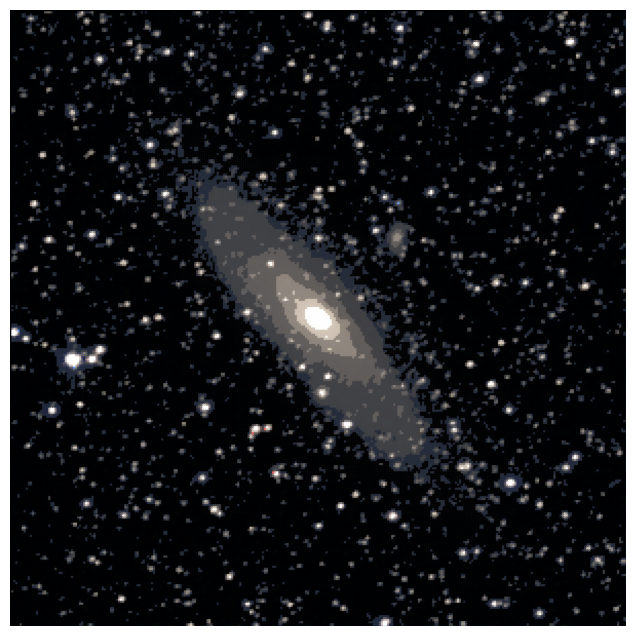

In [8]:
#Proof 


img_array = functions.figure_to_rgb_array(fig1)
category_map = functions.generate_color_categories (img_array)
cluster_map, centers = functions.cluster_KMeans_pixels(img_array, category_map, n_clusters = 5)
functions.plot_clusters_overlay(img_array, cluster_map, centers)


# MOD300 – Topic 2: Supervised learning – Machines versus human models

In this notebook we look at the Ebola epidemic in West Africa and compare a few
different supervised learning approaches. The idea is to see how simple
machine–learning models (linear regression, polynomial regression, a small
neural network and an LSTM) can be used to model the time evolution of the
number of new Ebola cases in three countries:

- **Guinea**
- **Liberia**
- **Sierra Leone**

This topic builds on Project 2, Exercise 5, where we used a mechanistic SEZR
type model (compartment model) to describe the same data. Here we ignore the
mechanistic structure and instead treat it as a pure data–driven regression
problem.

The tasks are:

* **Task 0** – Reproduce the basic data plots for the three countries
  (new cases + cumulative cases).
* **Task 1** – Fit a straight line using linear regression and inspect the fit.
* **Task 2** – Fit a “better” regression model (here: polynomial regression).
* **Task 3** – Train a small feed–forward neural network (MLP) on the data.
* **Task 4** – Train a simple LSTM for time–series prediction.
* **Task 5** – Discuss and summarise what we see, and reflect on when machine
  learning is useful compared to mechanistic models.


In [9]:

import numpy as np
import matplotlib.pyplot as plt





from ebola_ml import (
    load_ebola_data,
    plot_data_and_cumulative,
    fit_linear_regression,
    plot_linear_regression,
    fit_polynomial_regression,
    plot_polynomial_regression,
    fit_mlp_regressor,
    plot_mlp_regression,
    fit_lstm,
    plot_lstm_results,
)

country_files = {
    "Guinea": "ebola_cases_guinea.dat",
    "Liberia": "ebola_cases_liberia.dat",
    "Sierra Leone": "ebola_cases_sierra_leone.dat",
}

country_data = {}
for name, fname in country_files.items():
    days, new_cases, cumulative = load_ebola_data(fname)
    country_data[name] = {
        "days": days,
        "new_cases": new_cases,
        "cumulative": cumulative,
    }

print("Loaded data for:", ", ".join(country_data.keys()))


2025-11-24 17:49:53.687368: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-24 17:49:53.721526: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Loaded data for: Guinea, Liberia, Sierra Leone


2025-11-24 17:49:54.967762: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.



## Task 0 – Reproduce the Ebola plots from Project 2

In Project 2 we plotted the number of new outbreaks per day together with the
cumulative number of outbreaks. Here we reproduce the same style of figures
for the three countries using a helper function from `ebola_ml.py`.


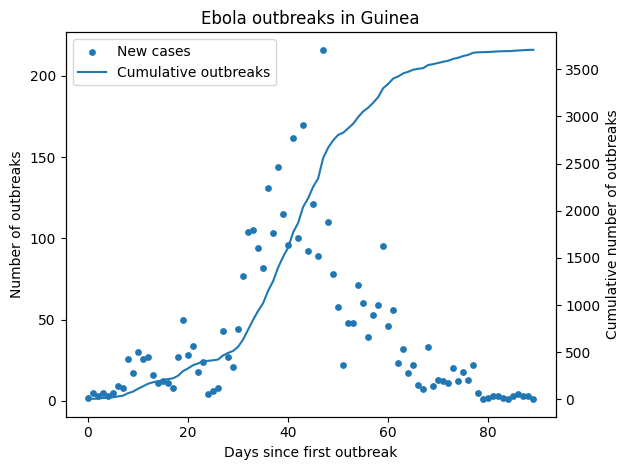

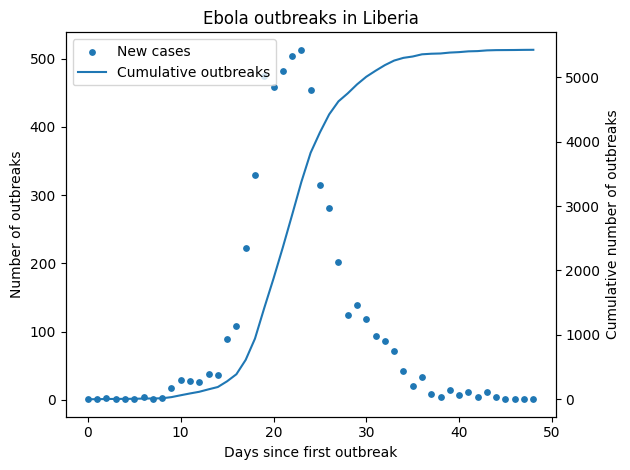

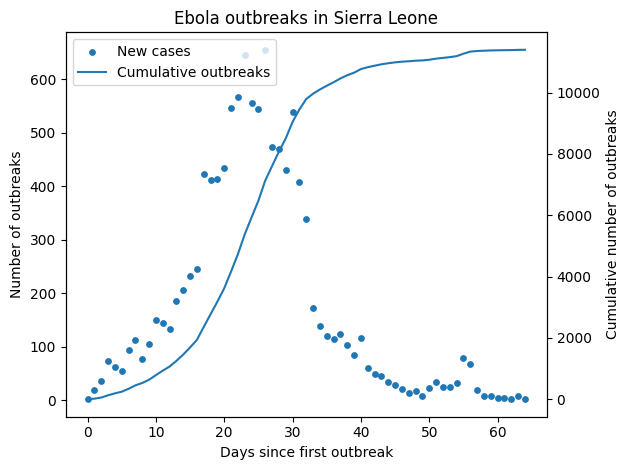

In [10]:

for name, data in country_data.items():
    days = data["days"]
    new_cases = data["new_cases"]
    cumulative = data["cumulative"]
    plot_data_and_cumulative(days, new_cases, cumulative, name)



## Task 1 – Linear regression

We now fit a **straight line** to the daily number of new cases as a function
of time. This is a very simple model and we do not expect it to work well, but
it is a good baseline.


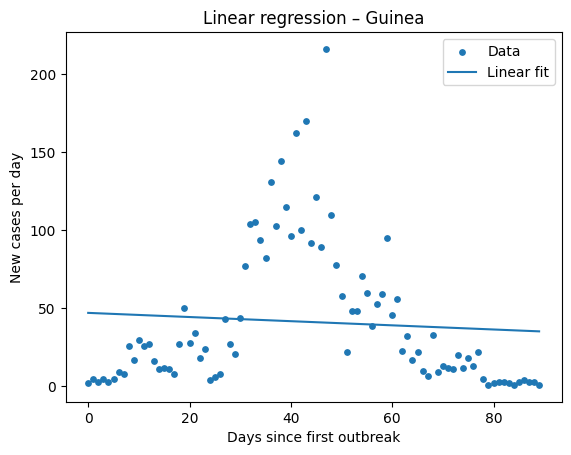

Guinea: linear model y = -0.1328 * t + 47.10
  -> The straight line clearly cannot capture the peak and decay of the epidemic.



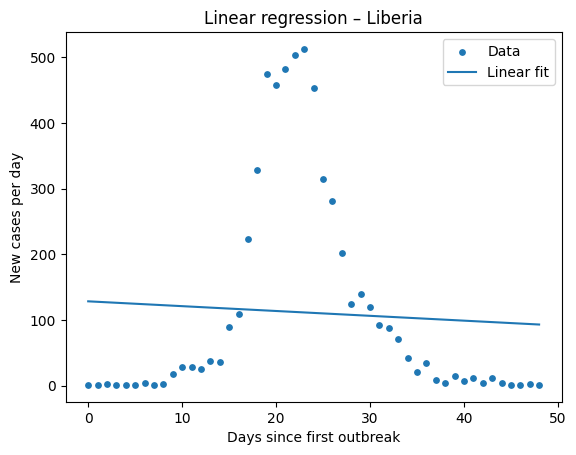

Liberia: linear model y = -0.7363 * t + 128.39
  -> The straight line clearly cannot capture the peak and decay of the epidemic.



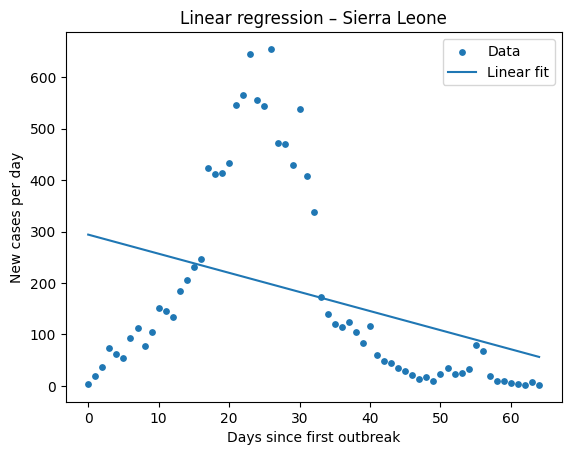

Sierra Leone: linear model y = -3.7145 * t + 294.13
  -> The straight line clearly cannot capture the peak and decay of the epidemic.



In [11]:

for name, data in country_data.items():
    days = data["days"]
    new_cases = data["new_cases"]

    lin_model = fit_linear_regression(days, new_cases)
    plot_linear_regression(days, new_cases, lin_model, name, "New cases per day")

    a = lin_model.coef_[0]
    b = lin_model.intercept_
    print(f"{name}: linear model y = {a:.4f} * t + {b:.2f}")
    print("  -> The straight line clearly cannot capture the peak and decay of the epidemic.\n")


## Task 2 – Better regression model (polynomial regression)

As a slightly more flexible model we use **polynomial regression** (degree 4).


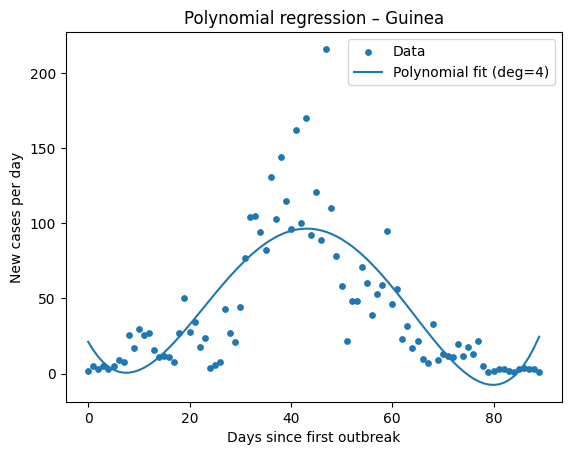

Guinea: polynomial regression of degree 4 used.



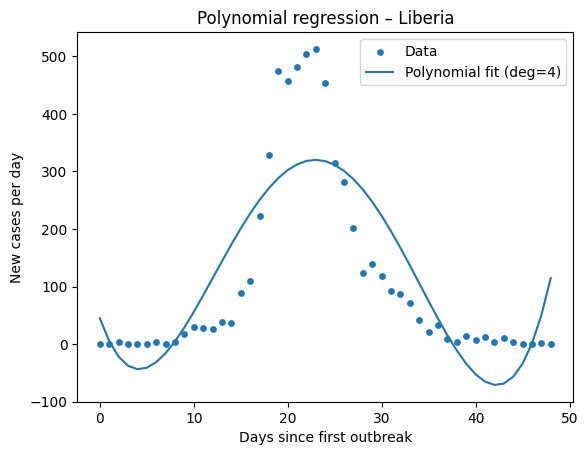

Liberia: polynomial regression of degree 4 used.



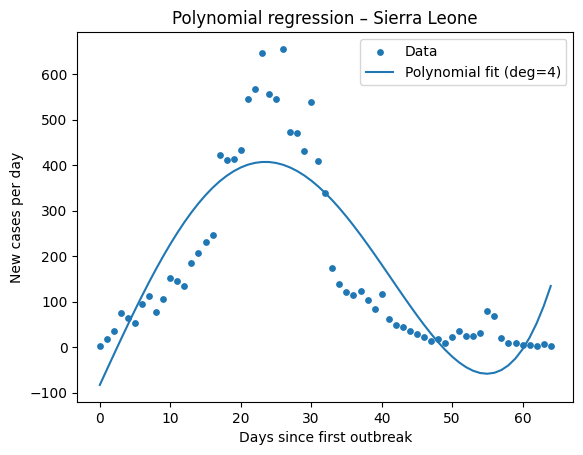

Sierra Leone: polynomial regression of degree 4 used.



In [12]:

for name, data in country_data.items():
    days = data["days"]
    new_cases = data["new_cases"]

    poly_model, poly = fit_polynomial_regression(days, new_cases, degree=4)
    plot_polynomial_regression(days, new_cases, poly_model, poly, name, "New cases per day")

    print(f"{name}: polynomial regression of degree 4 used.\n")


## Task 3 – Feed–forward neural network (MLP)

Next we try a small **neural network** using scikit–learn's `MLPRegressor`.


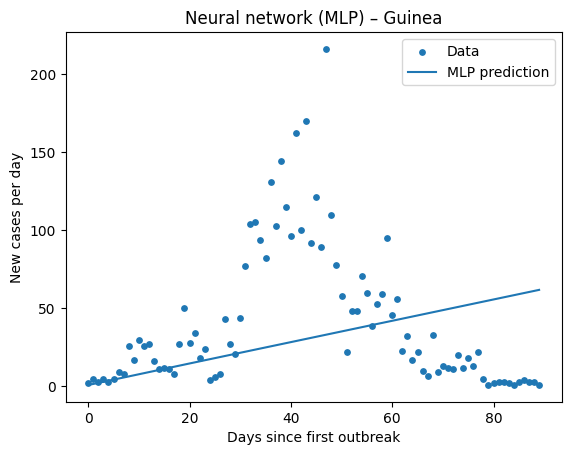

Guinea: MLP with two hidden layers (20, 20) trained.



/home/audun/Pythontestinggrounds/mod300/.venv/lib/python3.13/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


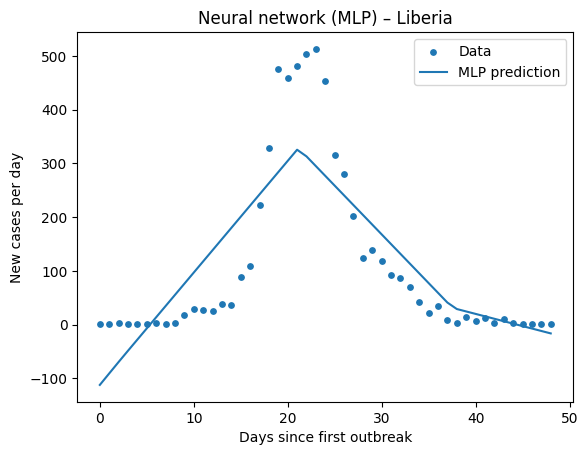

Liberia: MLP with two hidden layers (20, 20) trained.



/home/audun/Pythontestinggrounds/mod300/.venv/lib/python3.13/site-packages/sklearn/neural_network/_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


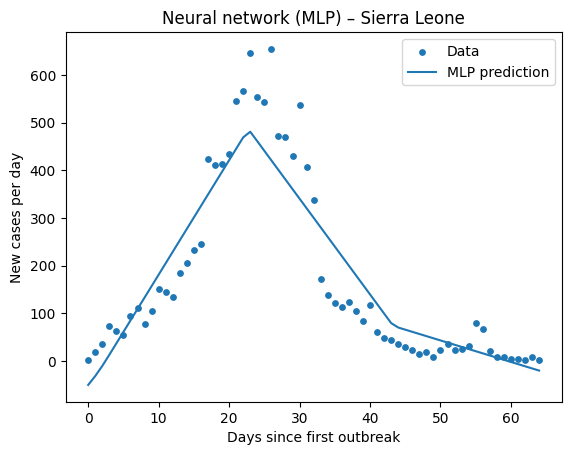

Sierra Leone: MLP with two hidden layers (20, 20) trained.



In [13]:

for name, data in country_data.items():
    days = data["days"]
    new_cases = data["new_cases"]

    mlp = fit_mlp_regressor(days, new_cases, hidden_layers=(20, 20), max_iter=2000)
    plot_mlp_regression(days, new_cases, mlp, name, "New cases per day")

    print(f"{name}: MLP with two hidden layers (20, 20) trained.\n")



## Task 4 – LSTM model for time–series prediction

Finally we use an **LSTM (Long Short-Term Memory) network**, which is a type
of recurrent neural network designed for time–series.


2025-11-24 17:49:57.767645: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
/home/audun/Pythontestinggrounds/mod300/.venv/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


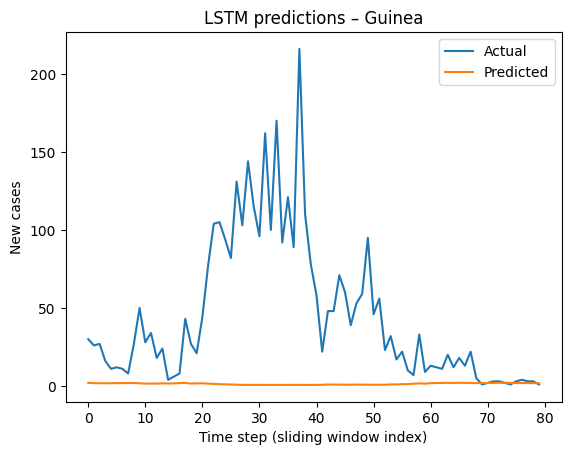

Guinea: LSTM trained with window=10, epochs=10.

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


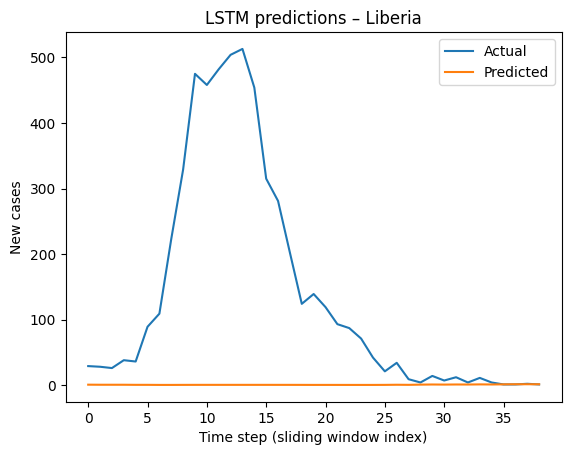

Liberia: LSTM trained with window=10, epochs=10.

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/stepWARNING:tensorflow:6 out of the last 7 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x7381f9fbbe20> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


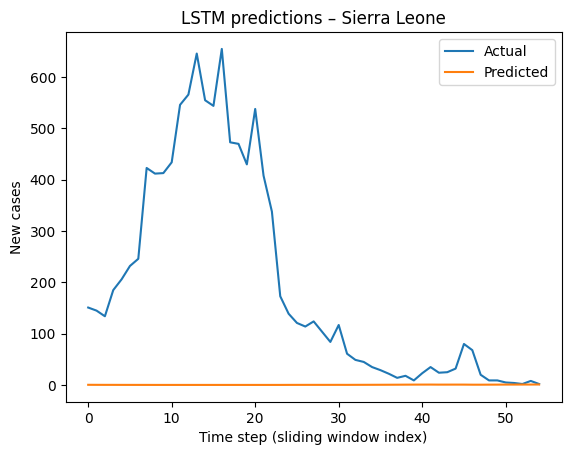

Sierra Leone: LSTM trained with window=10, epochs=10.



In [14]:

window = 10
epochs = 10

for name, data in country_data.items():
    new_cases = data["new_cases"].astype(float)

    try:
        lstm_model, X_lstm, y_lstm, y_pred_lstm = fit_lstm(new_cases, window=window, epochs=epochs, verbose=0)
        plot_lstm_results(y_lstm, y_pred_lstm, name)
        print(f"{name}: LSTM trained with window={window}, epochs={epochs}.\n")
    except RuntimeError as e:
        print(f"{name}: could not train LSTM ({e}).\n")



## Task 5 – Discussion and conclusions

(Write your own reflections here. A short template text was provided in the
version generated by ChatGPT and can be edited freely.)


## Reflection

ROMAN: As for the first topic, I can say that the complexity of the exercise made it quite interesting that it did not overreach in difficulty, nor it was boring to the point of not being able to continue the exercise. It did take a fresh idea of image and cluster management as it also made an important point into the form of storage or how one could store images and also rearrange them depending on the color and the characteristics of each pixel. It also brough the impotrance of characteristics of each image and a new perspective to the way images are collected from space and stored in a program and then able to anaylize them through models. 

## Conclusion

ROMAN: In my opinion this exercise brought the "fun" and the newness of the universes touch into the exercise, as it also taught us the complexity and importance of the processing of cluster and how sometimes, simplicity is better than the vast amount that is served on a plate (as for the quantity of colors that can be design with RBG)

## References 

[1]«Welcome to mw-plot’s documentation! — mw-plot 0.14.0.dev0 documentation». Åpnet: 18. november 2025. [Online]. Tilgjengelig på: https://milkyway-plot.readthedocs.io/en/latest/index.html

[2]«Alpha compositing», Wikipedia. 17. november 2025. Åpnet: 18. november 2025. [Online]. Tilgjengelig på: https://en.wikipedia.org/w/index.php?title=Alpha_compositing&oldid=1322741747

[3] H.-S. Park og C.-H. Jun, «A simple and fast algorithm for K-medoids clustering», Expert Systems with Applications, bd. 36, nr. 2, Part 2, s. 3336–3341, mar. 2009, doi: 10.1016/j.eswa.2008.01.039.

[4]«k-nearest neighbors algorithm», Wikipedia. 10. september 2025. Åpnet: 18. november 2025. [Online]. Tilgjengelig på: https://en.wikipedia.org/w/index.php?title=K-nearest_neighbors_algorithm&oldid=1310572110

[5]«Cluster analysis», Wikipedia. 16. november 2025. Åpnet: 18. november 2025. [Online]. Tilgjengelig på: https://en.wikipedia.org/w/index.php?title=Cluster_analysis&oldid=1322471715